# Project Overview

Author: Kavyansh Jain

We are using Univeristy of California Dataset "adult" which is a census data for different adults which can be helpful to predict the income of the person.

## Importing Libraries and Dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [4]:
train_df = pd.read_csv('data/adult.csv')
train_df.head()

,Age,Workclass,Final Weight,Education,EducationNum,Marital Status,Occupation,Relationship,Race,Gender,Capital Gain,capital loss,Hours per Week,Native Country,Income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [5]:
train_df.shape

(32561, 15)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32561 non-null  int64 
 1   Workclass       32561 non-null  object
 2   Final Weight    32561 non-null  int64 
 3   Education       32561 non-null  object
 4   EducationNum    32561 non-null  int64 
 5   Marital Status  32561 non-null  object
 6   Occupation      32561 non-null  object
 7   Relationship    32561 non-null  object
 8   Race            32561 non-null  object
 9   Gender          32561 non-null  object
 10  Capital Gain    32561 non-null  int64 
 11  capital loss    32561 non-null  int64 
 12  Hours per Week  32561 non-null  int64 
 13  Native Country  32561 non-null  object
 14  Income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [7]:
train_df.isnull().sum()

Age               0
Workclass         0
Final Weight      0
Education         0
EducationNum      0
Marital Status    0
Occupation        0
Relationship      0
Race              0
Gender            0
Capital Gain      0
capital loss      0
Hours per Week    0
Native Country    0
Income            0
dtype: int64

In [8]:
train_df.describe()

,Age,Final Weight,EducationNum,Capital Gain,capital loss,Hours per Week
count,32561.00,32561.00,32561.00,32561.00,32561.00,32561.00
mean,38.58,189778.37,10.08,1077.65,87.30,40.44
std,13.64,105549.98,2.57,7385.29,402.96,12.35
min,17.00,12285.00,1.00,0.00,0.00,1.00
25%,28.00,117827.00,9.00,0.00,0.00,40.00
50%,37.00,178356.00,10.00,0.00,0.00,40.00
75%,48.00,237051.00,12.00,0.00,0.00,45.00
max,90.00,1484705.00,16.00,99999.00,4356.00,99.00


Here our missing values are also counted as non null because of '?' inserted in the fields.

So let's check them and correct them

firstly we should strip the string values with any extra spaces before or after them

In [9]:
train_df = train_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [10]:
# Count the number of '?' in each column
for column in train_df.columns:
    count = (train_df[column] == '?').sum()
    print(f"{column}: {count} values")

Age: 0 values
Workclass: 1836 values
Final Weight: 0 values
Education: 0 values
EducationNum: 0 values
Marital Status: 0 values
Occupation: 1843 values
Relationship: 0 values
Race: 0 values
Gender: 0 values
Capital Gain: 0 values
capital loss: 0 values
Hours per Week: 0 values
Native Country: 583 values
Income: 0 values


There is a huge amount of fields with missing values in them let's replace them with np.nan so that the program can also detect them.

In [11]:
# Replace '?' with pd.nan
train_df = train_df.replace('?', np.nan)

In [12]:
train_df.isnull().sum()

Age                  0
Workclass         1836
Final Weight         0
Education            0
EducationNum         0
Marital Status       0
Occupation        1843
Relationship         0
Race                 0
Gender               0
Capital Gain         0
capital loss         0
Hours per Week       0
Native Country     583
Income               0
dtype: int64

Let's visualise the nullity using a bar chart

In [13]:
missing_counts = train_df.isnull().sum()
missing_df = missing_counts.reset_index()
missing_df.columns = ['Category', 'Missing Count']

fig = px.bar(missing_df, x='Category', y ='Missing Count')
fig.show()

Let's treat this null values and then start our analysis of the categories

Since our missing values are all in non-numerical columns, so the best way will be mode imputation, we will replace the missing values with the mode of the column.

In [14]:
for column in ['Workclass', 'Occupation', 'Native Country']:
    mode_value = train_df[column].mode()[0]
    train_df[column].fillna(mode_value, inplace=True)

In [15]:
train_df.isnull().sum()

Age               0
Workclass         0
Final Weight      0
Education         0
EducationNum      0
Marital Status    0
Occupation        0
Relationship      0
Race              0
Gender            0
Capital Gain      0
capital loss      0
Hours per Week    0
Native Country    0
Income            0
dtype: int64

now our data is completely without any null values.

let's start with our analysis of the different categories,

# Feature Analysis

First we will start with Numerical Features

In [16]:
# let's classify our features first

categories = train_df.dtypes

numeric_cat = categories[categories != 'object'].index
quality_cat = categories[categories == 'object'].drop('Income').index

In [17]:
numeric_cat

Index(['Age', 'Final Weight', 'EducationNum', 'Capital Gain', 'capital loss',
       'Hours per Week'],
      dtype='object')

In [18]:
quality_cat

Index(['Workclass', 'Education', 'Marital Status', 'Occupation',
       'Relationship', 'Race', 'Gender', 'Native Country'],
      dtype='object')

In [19]:
train_df['Income'].value_counts(normalize = True)

Income
<=50K   0.76
>50K    0.24
Name: proportion, dtype: float64

So we have a 24 % higher than 50k income

In [20]:
for i in numeric_cat:
  fig=px.histogram(train_df, x=i, color='Income')
  fig.show()

Here are the insights from the plotted histograms for each numerical feature:

*   **Age:** Older individuals are more likely to have higher incomes.
*   **Final Weight:** Not a strong predictor of income level.
*   **EducationNum:** Higher education levels (`EducationNum`) are strongly associated with higher income.
*   **Capital Gain:** Positive capital gains are more prevalent in the >50K income group.
*   **Capital Loss:** Does not appear to be a strong differentiating factor for income level.
*   **Hours per Week:** Individuals working more hours per week might have a slightly higher chance of being in the >50K income group.

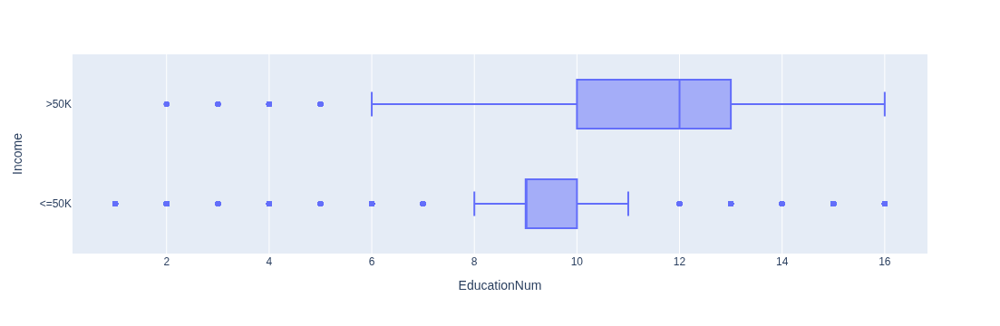

In [21]:
for i in numeric_cat:
  fig=px.box(train_df, x=i, y='Income')
  fig.show()

In [22]:
for i in numeric_cat:
  fig=px.box(train_df, x='Income', y=i)
  fig.show()

Here are the insights from the plotted box plots for each numerical feature:

*   **Age:** The median age for the >50K income group is slightly higher than for the <=50K group, with a wider spread for higher earners.
*   **Final Weight:** The distributions of Final Weight are very similar for both income groups, reinforcing that it's not a strong income predictor.
*   **EducationNum:** The box plot clearly shows a significantly higher median and upper quartile for EducationNum in the >50K income group, indicating a strong positive relationship between education level and income.
*   **Capital Gain:** The box plots highlight the presence of higher Capital Gain values in the >50K income group, with many outliers indicating substantial gains for some individuals in this category.
*   **Capital Loss:** Similar distributions for Capital Loss across both income groups, suggesting it's not a key differentiator.
*   **Hours per Week:** The median hours per week worked is slightly higher for the >50K income group, with a greater range and more outliers on the higher end, indicating that working longer hours is somewhat associated with higher income.

Based on the univariate analysis of the numerical features using histograms and box plots, the following features show a notable difference between the income groups and should be considered as important for training a model to predict income:

*   **Age:** Older individuals are more likely to have higher incomes.
*   **EducationNum:** Higher education levels are strongly associated with higher income.
*   **Capital Gain:** Positive capital gains are more prevalent in the >50K income group.
*   **Capital Loss:** While not as strong a predictor as others, it is included for consideration.
*   **Hours per Week:** Working longer hours is somewhat associated with higher income.

'Final Weight' does not appear to be a strong predictor of income based on this initial analysis.

### Now we start with Quality Features

In [23]:
for i in quality_cat:
  fig = px.histogram(train_df, x=i, color="Income", barmode='group')
  fig.show()

Here are the insights from the plotted histograms for each quality feature:

*   **Workclass:** Private workclass dominates both income groups, but Self-emp-inc, Federal-gov, and State-gov show a higher proportion of individuals in the >50K income bracket compared to their <=50K counterparts.
*   **Education:** As seen with EducationNum, higher education levels like Bachelors, Masters, Prof-school, and Doctorate have a significantly higher proportion of individuals earning >50K.
*   **Marital Status:** Married-civ-spouse shows a much higher likelihood of earning >50K compared to other marital statuses. Never-married individuals are overwhelmingly in the <=50K income group.
*   **Occupation:** Certain occupations like Exec-managerial and Prof-specialty have a considerably higher representation in the >50K income group. Others like Handlers-cleaners and Farming-fishing are predominantly in the <=50K group.
*   **Relationship:** Husbands and Wives have a much higher proportion of individuals earning >50K compared to other relationship statuses like Not-in-family or Own-child.
*   **Race:** The income distribution is skewed towards <=50K for all races, but White and Asian-Pac-Islander categories show a slightly higher proportion of individuals in the >50K income group compared to other races. However, the difference is not as pronounced as in other categorical features.
*   **Gender:** Males have a significantly higher proportion of individuals earning >50K compared to Females.
*   **Native Country:** The vast majority of individuals in the dataset are from the United-States, and the income distribution within this group is similar to the overall distribution. Other native countries have a much smaller representation, making it difficult to draw strong conclusions about their impact on income. However, some countries like Iran, Philippines, and India show a slightly higher proportion of individuals earning >50K.

Based on this analysis, the following quality features appear to be important for predicting income and should be considered for model training:

*   **Workclass**
*   **Education**
*   **Marital Status**
*   **Occupation**
*   **Relationship**
*   **Gender**

The **Race** and **Native Country** features show less distinct differences in income distribution and could potentially be dropped or require further investigation and feature engineering if deemed necessary.

### Correlation of Numerical Categories

In [24]:
df_corr = train_df[numeric_cat].corr()

In [25]:
fig = px.imshow(df_corr, text_auto=True, aspect="auto")
fig.show()

Handling the outliers

In [26]:
outlier_features = ['Hours per Week', 'Capital Gain', 'capital loss']

for col in outlier_features:
    Q1 = train_df[col].quantile(0.25)
    Q3 = train_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = train_df[(train_df[col] < lower_bound) | (train_df[col] > upper_bound)]
    print(f"Outliers in '{col}': {len(outliers)}")
    print(outliers[col])

Outliers in 'Hours per Week': 9008
1        13
6        16
10       80
12       30
20       60
         ..
32544    30
32545    20
32548    60
32553    11
32559    20
Name: Hours per Week, Length: 9008, dtype: int64
Outliers in 'Capital Gain': 2712
0         2174
8        14084
9         5178
59        5013
60        2407
         ...  
32515     3471
32518    99999
32538    15020
32548     1086
32560    15024
Name: Capital Gain, Length: 2712, dtype: int64
Outliers in 'capital loss': 1519
23       2042
32       1408
52       1902
93       1573
96       1902
         ... 
32441    1887
32443    1602
32445    1669
32458    1977
32500     880
Name: capital loss, Length: 1519, dtype: int64


Capping outlier for Hours Per Week

In [27]:
train_df['Hours per Week'] = train_df['Hours per Week'].clip(upper=80)

For Captial Gain and Capital Loss
Apply a log transformation using np.log1p, which computes log(1 + x) to handle zeros, common in these features

In [28]:
train_df['Capital Gain'] = np.log1p(train_df['Capital Gain'])
train_df['capital loss'] = np.log1p(train_df['capital loss'])

### Now we will select our models and train them

In [29]:
test_df = pd.read_csv('data/adult.test.csv')
test_df.columns = ['Age','Workclass','Final Weight','Education','EducationNum','Marital Status','Occupation','Relationship','Race','Gender','Capital Gain','capital loss','Hours per Week','Native Country','Income']
test_df = test_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
test_df = test_df.replace('?', np.nan)

In [30]:
test_df = test_df.dropna()

In [31]:
train_df['Income'] = train_df['Income'].map({'<=50K': 0, '>50K': 1})
test_df['Income'] = test_df['Income'].map({'<=50K': 0, '>50K': 1})

In [32]:
columns_to_drop = ['Race', 'Native Country', 'Final Weight']
test_df = test_df.drop(columns=columns_to_drop)

columns_to_drop = ['Race', 'Native Country', 'Final Weight']
train_df = train_df.drop(columns=columns_to_drop)

In [33]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import joblib

In [34]:
# Separate features and target
X_train = train_df.drop('Income', axis=1)
y_train = train_df['Income']
X_test = test_df.drop('Income', axis=1)
y_test = test_df['Income']

# Drop 'Education' and keep 'Education-num'
X_train = X_train.drop('Education', axis=1)
X_test = X_test.drop('Education', axis=1)

# Define categorical and numerical columns
categorical_cols = ['Workclass', 'Marital Status', 'Occupation', 'Relationship', 'Gender']
numerical_cols = ['Age', 'EducationNum', 'Capital Gain', 'capital loss', 'Hours per Week']


In [35]:
print(y_test.isnull().sum())

0


In [36]:
# Create preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', 'passthrough', numerical_cols)
    ]
)

# Define models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, class_weight='balanced'),
    'Decision Tree': DecisionTreeClassifier(class_weight='balanced'),
    'Random Forest': RandomForestClassifier(class_weight='balanced'),
    'Gradient Boosting': GradientBoostingClassifier()
}

# Evaluate models using cross-validation
best_model_name = None
best_score = 0

for name, model in models.items():
    pipeline = Pipeline([('preprocessor', preprocessor), ('classifier', model)])
    scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
    mean_score = np.mean(scores)
    print(f"{name}: {mean_score:.4f}")
    if mean_score > best_score:
        best_score = mean_score
        best_model_name = name

print(f"Best model: {best_model_name} with accuracy: {best_score:.4f}")


Logistic Regression: 0.8011
Decision Tree: 0.8082
Random Forest: 0.8426
Gradient Boosting: 0.8653
Best model: Gradient Boosting with accuracy: 0.8653


In [37]:
# Train the best model on the entire training set
best_model = models[best_model_name]
best_pipeline = Pipeline([('preprocessor', preprocessor), ('classifier', best_model)])
best_pipeline.fit(X_train, y_train)

# Evaluate on the test set
y_pred = best_pipeline.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test accuracy: {test_accuracy:.4f}")

# Save the best model
joblib.dump(best_pipeline, 'best_model.pkl')

Test accuracy: 0.8337


['best_model.pkl']